# CIND 119 Final Project
## Part I

In [ ]:
# Load file
from google.colab import files

uploaded = files.upload()

for fn in uploaded.keys():
  print('User uploaded file "{name}" with length {length} bytes'.format(
      name=fn, length=len(uploaded[fn])))

Saving churn.arff to churn.arff
User uploaded file "churn.arff" with length 340783 bytes


In [ ]:
# Load Data file
import pandas as pd
from scipy.io import arff
import numpy as np

data_file="churn.arff"
data=arff.loadarff(data_file)

#Store data into Dataframe ('df')
df=pd.DataFrame(data[0])
print(df.dtypes)

for col in df.columns:
  if df[col].dtype=='object':
    #making sure data is not read as bytes but as string values from a file
    df[col] = df[col].str.decode('utf-8')

#Look at loaded data and data types
print(df.dtypes)


State                            object
Account Length                  float64
Area Code                        object
Phone Number                     object
Inter Plan                       object
VoiceMail Plan                   object
No of Vmail Mesgs               float64
Total Day Min                   float64
Total Day calls                 float64
Total Day Charge                float64
Total Evening Min               float64
Total Evening Calls             float64
Total Evening Charge            float64
Total Night Minutes             float64
Total Night Calls               float64
Total Night Charge              float64
Total Int Min                   float64
Total Int Calls                 float64
Total Int Charge                float64
No of Calls Customer Service    float64
Churn                            object
dtype: object
State                            object
Account Length                  float64
Area Code                        object
Phone Number              

In [ ]:
# look at meta information about data, such as null values
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3333 entries, 0 to 3332
Data columns (total 21 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   State                         3333 non-null   object 
 1   Account Length                3333 non-null   float64
 2   Area Code                     3333 non-null   object 
 3   Phone Number                  3333 non-null   object 
 4   Inter Plan                    3333 non-null   object 
 5   VoiceMail Plan                3333 non-null   object 
 6   No of Vmail Mesgs             3333 non-null   float64
 7   Total Day Min                 3333 non-null   float64
 8   Total Day calls               3333 non-null   float64
 9   Total Day Charge              3333 non-null   float64
 10  Total Evening Min             3333 non-null   float64
 11  Total Evening Calls           3333 non-null   float64
 12  Total Evening Charge          3333 non-null   float64
 13  Tot

In [ ]:
df.describe()

,Account Length,No of Vmail Mesgs,Total Day Min,Total Day calls,Total Day Charge,Total Evening Min,Total Evening Calls,Total Evening Charge,Total Night Minutes,Total Night Calls,Total Night Charge,Total Int Min,Total Int Calls,Total Int Charge,No of Calls Customer Service
count,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000
mean,101.064806,8.099010,179.775098,100.435644,30.562307,200.980348,100.114311,17.083540,200.872037,100.107711,9.039325,10.237294,4.479448,2.764581,1.562856
std,39.822106,13.688365,54.467389,20.069084,9.259435,50.713844,19.922625,4.310668,50.573847,19.568609,2.275873,2.791840,2.461214,0.753773,1.315491
min,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,23.200000,33.000000,1.040000,0.000000,0.000000,0.000000,0.000000
25%,74.000000,0.000000,143.700000,87.000000,24.430000,166.600000,87.000000,14.160000,167.000000,87.000000,7.520000,8.500000,3.000000,2.300000,1.000000
50%,101.000000,0.000000,179.400000,101.000000,30.500000,201.400000,100.000000,17.120000,201.200000,100.000000,9.050000,10.300000,4.000000,2.780000,1.000000
75%,127.000000,20.000000,216.400000,114.000000,36.790000,235.300000,114.000000,20.000000,235.300000,113.000000,10.590000,12.100000,6.000000,3.270000,2.000000
max,243.000000,51.000000,350.800000,165.000000,59.640000,363.700000,170.000000,30.910000,395.000000,175.000000,17.770000,20.000000,20.000000,5.400000,9.000000


In [ ]:
from pandas_profiling import ProfileReport
profile = ProfileReport(df)
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

5.	Analyze the distribution of numeric attributes (normal or other). Plot histograms for attributes of concern and analyze whether they have any influence on the class attribute.


In [ ]:
# Look at profiling report: 
# e.g.: Total Day Min is highly correlated with Total Day Charge -一共三组highly correlated
import matplotlib.pyplot as plt

plt.close("all")
# ?plt.close


6.	Which attributes seem to be correlated? Which attributes seem to be most linked to the class attribute?.



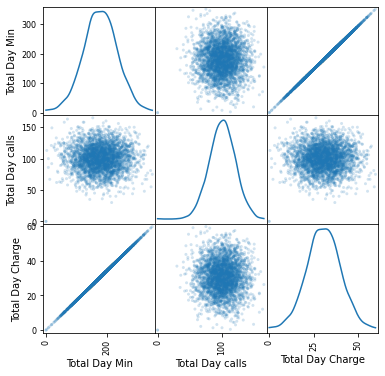

In [ ]:
# Minutes & Charge is always highly correlated - only keep one
# Total Day Min	/ Total Day calls /	Total Day Charge

from pandas.plotting import scatter_matrix

df_temp1 = df.loc[:, ["Total Day Min", "Total Day calls", "Total Day Charge"]]
# ?scatter_matrix
scatter_matrix(df_temp1, alpha=0.2, figsize=(6, 6), diagonal="kde");

In [ ]:
# Which attributes seem to be most linked to the class attribute? - use multiple regression or what?

7.	Which attributes do you think can be eliminated or included in the analysis? This can be a subjective decision or an objective decision based on a statistical method. 

Look at Dimensionality reduction method: (CMTH642)

1.Removing data columns with too many
missing values
2.Low variance filter
3.Reducing highly correlated columns
4.Principal component analysis
5.Dimensionality reduction via random
forest
6.Feature selection

In [ ]:
# Using Subjective analysis (Common Sense):
# Look at profiling report: Area Code + phone number can be eliminated - not relevant 
# How about State? - make prob table - normally not relevant
# Using objective analysis:
# 4 pairs of Minutes & Charge is always highly correlated - only keep one set 
# other methods? using multiple regression? look at t-stat? 
# PCA? https://zhuanlan.zhihu.com/p/521638308 